# Analyzing StackOverFlow2017 Survey Data

In [1]:
import sys, os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import seaborn as sns
%matplotlib inline

# print(os.listdir("./"))
pd.set_option('display.max_columns', None)

from collections import Counter 
from collections import defaultdict
import itertools

#!python -m pip install scikit-learn --user --upgrade pip

## Business Understanding
I brought a few questions we will be exploring throughout this notebook. 

1. What are the trends on tech tools?  
2. What profession has more promising income & the average developer salary?
3. How does experiance effect the related average developer salary?
4. Salary Prediction (Linear Regression)  


## Data Understanding 
To get started, let's read in the necessary libraries we will need to wrangle our data: pandas, sklearn and numpy. If we decided to build some basic plots, matplotlib & seaborn might prove useful as well.

### gathering data...

In [2]:
df = pd.read_csv('./survey_results_public.csv')
df.head(5)

,Respondent,Professional,ProgramHobby,Country,University,EmploymentStatus,FormalEducation,MajorUndergrad,HomeRemote,CompanySize,CompanyType,YearsProgram,YearsCodedJob,YearsCodedJobPast,DeveloperType,WebDeveloperType,MobileDeveloperType,NonDeveloperType,CareerSatisfaction,JobSatisfaction,ExCoderReturn,ExCoderNotForMe,ExCoderBalance,ExCoder10Years,ExCoderBelonged,ExCoderSkills,ExCoderWillNotCode,ExCoderActive,PronounceGIF,ProblemSolving,BuildingThings,LearningNewTech,BoringDetails,JobSecurity,DiversityImportant,AnnoyingUI,FriendsDevelopers,RightWrongWay,UnderstandComputers,SeriousWork,InvestTimeTools,WorkPayCare,KinshipDevelopers,ChallengeMyself,CompetePeers,ChangeWorld,JobSeekingStatus,HoursPerWeek,LastNewJob,AssessJobIndustry,AssessJobRole,AssessJobExp,AssessJobDept,AssessJobTech,AssessJobProjects,AssessJobCompensation,AssessJobOffice,AssessJobCommute,AssessJobRemote,AssessJobLeaders,AssessJobProfDevel,AssessJobDiversity,AssessJobProduct,AssessJobFinances,ImportantBenefits,ClickyKeys,JobProfile,ResumePrompted,LearnedHiring,ImportantHiringAlgorithms,ImportantHiringTechExp,ImportantHiringCommunication,ImportantHiringOpenSource,ImportantHiringPMExp,ImportantHiringCompanies,ImportantHiringTitles,ImportantHiringEducation,ImportantHiringRep,ImportantHiringGettingThingsDone,Currency,Overpaid,TabsSpaces,EducationImportant,EducationTypes,SelfTaughtTypes,TimeAfterBootcamp,CousinEducation,WorkStart,HaveWorkedLanguage,WantWorkLanguage,HaveWorkedFramework,WantWorkFramework,HaveWorkedDatabase,WantWorkDatabase,HaveWorkedPlatform,WantWorkPlatform,IDE,AuditoryEnvironment,Methodology,VersionControl,CheckInCode,ShipIt,OtherPeoplesCode,ProjectManagement,EnjoyDebugging,InTheZone,DifficultCommunication,CollaborateRemote,MetricAssess,EquipmentSatisfiedMonitors,EquipmentSatisfiedCPU,EquipmentSatisfiedRAM,EquipmentSatisfiedStorage,EquipmentSatisfiedRW,InfluenceInternet,InfluenceWorkstation,InfluenceHardware,InfluenceServers,InfluenceTechStack,InfluenceDeptTech,InfluenceVizTools,InfluenceDatabase,InfluenceCloud,InfluenceConsultants,InfluenceRecruitment,InfluenceCommunication,StackOverflowDescribes,StackOverflowSatisfaction,StackOverflowDevices,StackOverflowFoundAnswer,StackOverflowCopiedCode,StackOverflowJobListing,StackOverflowCompanyPage,StackOverflowJobSearch,StackOverflowNewQuestion,StackOverflowAnswer,StackOverflowMetaChat,StackOverflowAdsRelevant,StackOverflowAdsDistracting,StackOverflowModeration,StackOverflowCommunity,StackOverflowHelpful,StackOverflowBetter,StackOverflowWhatDo,StackOverflowMakeMoney,Gender,HighestEducationParents,Race,SurveyLong,QuestionsInteresting,QuestionsConfusing,InterestedAnswers,Salary,ExpectedSalary
0,1,Student,"Yes, both",United States,No,"Not employed, and not looking for work",Secondary school,NaN,NaN,NaN,NaN,2 to 3 years,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"With a soft ""g,"" like ""jiff""",Strongly agree,Strongly agree,Agree,Disagree,Strongly agree,Agree,Agree,Disagree,Somewhat agree,Disagree,Strongly agree,Strongly agree,Strongly disagree,Agree,Agree,Disagree,Agree,"I'm not actively looking, but I am open to new...",0.0,Not applicable/ never,Very important,Very important,Important,Very important,Very important,Very important,Important,Very important,Very important,Very important,Very important,Very important,Somewhat important,Not very important,Somewhat important,Stock options; Vacation/days off; Remote options,Yes,Other,NaN,NaN,Important,Important,Important,Somewhat important,Important,Not very important,Not very important,Not at all important,Somewhat important,Very important,NaN,NaN,Tabs,NaN,Online course; Open source contributions,NaN,NaN,NaN,6:00 AM,Swift,Swift,NaN,NaN,NaN,NaN,iOS,iOS,Atom; Xcode,Turn on some music,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Somewhat satisfied,Not very satisfied,Not at all satisfied,Very satisfied,Satisfied,Not very satisfied,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I have created a CV or Developer Story on Stac...,9.0,Desktop; iOS app,At leas

In [3]:
schDf = pd.read_csv('./survey_results_schema.csv')
schDf.head(10)

,Column,Question
0,Respondent,Respondent ID number
1,Professional,Which of the following best describes you?
2,ProgramHobby,Do you program as a hobby or contribute to ope...
3,Country,In which country do you currently live?
4,University,"Are you currently enrolled in a formal, degree..."
5,EmploymentStatus,Which of the following best describes your cur...
6,FormalEducation,Which of the following best describes the high...
7,MajorUndergrad,Which of the following best describes your mai...
8,HomeRemote,How often do you work from home or remotely?
9,CompanySize,"In terms of the number of employees, how large..."


### assessing data...

In [4]:
df.shape

(19102, 154)

In [5]:
schDf.shape

(154, 2)

In [6]:
df.describe()

,Respondent,CareerSatisfaction,JobSatisfaction,HoursPerWeek,StackOverflowSatisfaction,Salary,ExpectedSalary
count,19102.000000,16102.000000,15253.000000,7721.000000,13452.000000,5009.000000,818.000000
mean,9551.500000,7.343932,7.000721,3.685922,8.357865,58341.398571,32231.521687
std,5514.416757,1.919330,2.128648,7.330691,1.405546,40753.384986,28543.877274
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4776.250000,6.000000,6.000000,0.000000,8.000000,27956.989247,4716.459735
50%,9551.500000,8.000000,7.000000,1.000000,8.000000,51612.903226,29784.946237
75%,14326.750000,9.000000,8.000000,3.000000,9.000000,83333.333333,50000.000000
max,19102.000000,10.000000,10.000000,40.000000,10.000000,195000.000000,120000.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19102 entries, 0 to 19101
Columns: 154 entries, Respondent to ExpectedSalary
dtypes: float64(6), int64(1), object(147)
memory usage: 22.4+ MB


In [8]:
schDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 154 entries, 0 to 153
Data columns (total 2 columns):
Column      154 non-null object
Question    154 non-null object
dtypes: object(2)
memory usage: 2.5+ KB


# What are trends on tech tools?

In [9]:
df[["HaveWorkedLanguage", "WantWorkLanguage", "HaveWorkedFramework", "WantWorkFramework", "HaveWorkedDatabase", "WantWorkDatabase", "HaveWorkedPlatform", "WantWorkPlatform"]].dropna(how='all')

,HaveWorkedLanguage,WantWorkLanguage,HaveWorkedFramework,WantWorkFramework,HaveWorkedDatabase,WantWorkDatabase,HaveWorkedPlatform,WantWorkPlatform
0,Swift,Swift,NaN,NaN,NaN,NaN,iOS,iOS
1,JavaScript; Python; Ruby; SQL,Java; Python; Ruby; SQL,.NET Core,.NET Core,MySQL; SQLite,MySQL; SQLite,Amazon Web Services (AWS),Linux Desktop; Raspberry Pi; Amazon Web Servic...
2,Java; PHP; Python,C; Python; Rust,NaN,NaN,MySQL,NaN,NaN,NaN
3,Matlab; Python; R; SQL,Matlab; Python; R; SQL,React,Hadoop; Node.js; React,MongoDB; Redis; SQL Server; MySQL; SQLite,MongoDB; Redis; SQL Server; MySQL; SQLite,Windows Desktop; Linux Desktop; Mac OS; Amazon...,Windows Desktop; Linux Desktop; Mac OS; Amazon...
5,JavaScript; PHP; Rust,Clojure; Elixir; Erlang; Haskell; Rust; TypeSc...,NaN,NaN,MySQL,NaN,Linux Desktop; Amazon Web Services (AWS),Linux Desktop
6,Matlab; Python,JavaScript; Julia; Matlab; Python; R; SQL,NaN,Hadoop; Node.js,SQLite,MongoDB; SQL Server; PostgreSQL; SQLite,Windows Desktop,Arduino; Raspberry Pi
7,CoffeeScript; Clojure; Elixir; Erlang; Haskell...,Clojure; Elixir; Haskell; Scala,React,NaN,Redis; MySQL; PostgreSQL,NaN,Amazon Web Services (AWS),NaN
8,C#; JavaScript,F#; Go,AngularJS; Node.js; .NET Core,Hadoop; React; Spark,SQL Server,Cassandra; Redis,Android; Microsoft Azure,Serverless; Amazon Web Services (AWS); Microso...
9,Objective-C; Swift,C#; Java; Objective-C; Swift,NaN,.NET Core,PostgreSQL,NaN,iOS; Amazon Web Services (AWS),Android; iOS; Windows Phone; Windows Desktop
10,R; SQL,C#; R; SQL,NaN,NaN,SQL Server,SQL Server,NaN,NaN


### cleaning, analyzing & visualizing data

In [10]:
def techTrend(dataframe, field):
    """ takes the tech field in df splits conjoint data for HaveWorked&HaveWorked calculates differences and visualizes it.
    dataframe: dataframe that you'd like to examine the fields from
    field: the tech field you'dlike to examine *possible_vals:(Language, Framework, Database, Platform)
    """
    
    new_df = defaultdict(int)
    c = field
    types= ["HaveWorked", "WantWork"]
    
    # cleaning data
    for col_type in types:
        
        each = dataframe[col_type + field].dropna()
        each.shape[0]
        List = '; '.join(each.tolist()).split("; ")
        new_df[col_type + field] = List

        Df = pd.DataFrame.from_dict(Counter(List), orient='index').reset_index().set_index('index')
        Df.rename(columns={0: col_type}, inplace=True)

        if col_type=="HaveWorked":
            HaveWorkedDf = Df
            HaveWorked = each.shape[0]
        elif col_type=="WantWork":
            WantWorkDf = Df
            WantWork = each.shape[0]
    
    # analyzing data
    baseDf = pd.DataFrame(list(dict.fromkeys(new_df['HaveWorked'+field] + new_df['WantWork'+c])), columns=[c]).set_index(c)
    baseDf = baseDf.join(HaveWorkedDf).join(WantWorkDf)
    baseDf["Changes"] = baseDf["WantWork"]-baseDf["HaveWorked"]
    baseDf["HaveWorked%"] = baseDf["HaveWorked"]/HaveWorked*100
    baseDf["WantWork%"] = baseDf["WantWork"]/WantWork*100
    new_df[c] = baseDf.sort_values(by=["Changes"], ascending=False)

    display(c)
    
    # visualizing data
    display(new_df[c].style.set_properties(**{'background-color': 'black', 'color': 'black', 'border-color': 'white'})\
                     .bar(subset=['Changes'], align='mid', color=['#900C3F', '#649867'])\
                     .background_gradient(subset=['HaveWorked', 'WantWork'], low=0, high=0.5, cmap="BuPu")\
                     .background_gradient(subset=['HaveWorked%', 'WantWork%'], low=0, high=0.5, cmap="RdPu"))



In [11]:
fields = ["Language", "Framework", "Database", "Platform"]

for i in fields:
    techTrend(df, i)

'Language'

,HaveWorked,WantWork,Changes,HaveWorked%,WantWork%
Language,,,,,
Go,602,2161,1559,4.45069,17.2562
Rust,168,1162,994,1.24205,9.27893
TypeScript,1382,2241,859,10.2174,17.8951
F#,185,892,707,1.36774,7.12289
Swift,832,1536,704,6.15112,12.2654
Haskell,242,918,676,1.78915,7.33051
Scala,518,1187,669,3.82966,9.47856
Elixir,138,636,498,1.02026,5.07866
Clojure,142,515,373,1.04983,4.11243


'Framework'

,HaveWorked,WantWork,Changes,HaveWorked%,WantWork%
Framework,,,,,
React,1552,3290,1738,21.2778,38.7104
Node.js,3394,4189,795,46.5314,49.2882
Xamarin,606,1375,769,8.3082,16.1784
Hadoop,389,1113,724,5.33315,13.0957
.NET Core,2354,3064,710,32.2731,36.0513
Spark,350,931,581,4.79846,10.9542
Firebase,647,968,321,8.8703,11.3896
AngularJS,3217,3505,288,44.1047,41.2401
Cordova,742,727,-15,10.1727,8.55395


'Database'

,HaveWorked,WantWork,Changes,HaveWorked%,WantWork%
Database,,,,,
MongoDB,2191,3387,1196,20.3021,36.98
Redis,1671,2470,799,15.4837,26.968
Cassandra,337,1100,763,3.12268,12.01
PostgreSQL,2919,3129,210,27.0478,34.1631
SQLite,2808,2079,-729,26.0193,22.699
Oracle,1685,951,-734,15.6134,10.3832
SQL Server,4175,2658,-1517,38.6861,29.0206
MySQL,5675,3324,-2351,52.5852,36.2922


'Platform'

,HaveWorked,WantWork,Changes,HaveWorked%,WantWork%
Platform,,,,,
Raspberry Pi,1523,2725,1202,14.3951,26.8261
Android,2650,3621,971,25.0473,35.6468
Amazon Web Services (AWS),3046,3916,870,28.7902,38.5509
iOS,1649,2437,788,15.586,23.9909
Arduino,923,1526,603,8.72401,15.0226
Serverless,255,769,514,2.41021,7.57039
Microsoft Azure,1285,1759,474,12.1456,17.3164
Windows Phone,381,505,124,3.60113,4.97145
Mainframe,144,120,-24,1.36106,1.18133


# What profession has more promising income & the average developer salary?

### cleaning data...

In [12]:
from collections import Counter 
from collections import defaultdict

def unqList(df, col):
    """ takes the conjoint column value splits it into unique list 
    df: dataframe that you'd like to take the column with the conjoint value
    col: column in the dataframe with the conjoint value
    """
    givenList = df[col].dropna().tolist()
    givenString = '; '.join(givenList)
    
    givenString = givenString.split("; ")
    
    for i in range(0, len(givenString)): 
        givenString[i] = "".join(givenString[i]) 

    List = "; ".join(Counter(givenString).keys()).split("; ")
    
    return List

In [13]:
developerTypes = unqList(df, 'DeveloperType')
developerTypes

['Other',
 'Mobile developer',
 'Graphics programming',
 'Desktop applications developer',
 'Web developer',
 'Embedded applications/devices developer',
 'DevOps specialist',
 'Quality assurance engineer',
 'Data scientist',
 'Machine learning specialist',
 'Developer with a statistics or mathematics background',
 'Database administrator',
 'Systems administrator',
 'Graphic designer']

In [14]:
roleExpDF=defaultdict(dict)
roleDF=defaultdict(dict)

yearsProgram = unqList(df, 'YearsCodedJob')
        
targ=df[['DeveloperType', 'YearsCodedJob', 'Salary']].dropna().reset_index()

for dVal in developerTypes:
    
    roleDF[dVal]={}
    roleDF[dVal]['Salary'] =0
    roleDF[dVal]['Count'] =0
    roleDF[dVal]['Avg'] =0
    for pVal in yearsProgram:
        if pVal=='Less than a year':
            yVal = 1
        elif pVal=='20 or more years':
            yVal = 20
        else:
            yVal = int(pVal[-8:][:2].strip())
            
        roleExpDF[(dVal,yVal)]={}
        roleExpDF[(dVal,yVal)]['Salary'] =0
        roleExpDF[(dVal,yVal)]['Count'] =0
        roleExpDF[(dVal,yVal)]['Avg'] =0
        for i in range(targ.shape[0]):
            if pVal in targ['YearsCodedJob'][i]:
                if dVal in targ['DeveloperType'][i]:

                        roleExpDF[(dVal,yVal)]['Salary'] += targ['Salary'][i]
                        roleExpDF[(dVal,yVal)]['Count'] += int(1)
                        roleExpDF[(dVal,yVal)]['Avg'] =round(roleExpDF[(dVal,yVal)]['Salary']/roleExpDF[(dVal,yVal)]['Count'],2)

                        roleDF[dVal]['Salary'] += targ['Salary'][i]
                        roleDF[dVal]['Count'] += int(1)
                        roleDF[dVal]['Avg'] =round(roleDF[dVal]['Salary']/roleDF[dVal]['Count'],2)


In [15]:
roleDf = pd.DataFrame(roleDF).transpose().dropna().drop('Other')

### analyzing data...

In [16]:
roleDf[["Avg"]].sort_values("Avg", ascending=False)
roleDf.columns = ['average_salary', "count", "salary"]
roleDf

,average_salary,count,salary
Mobile developer,52554.05,974.0,5.118765e+07
Graphics programming,56036.01,176.0,9.862337e+06
Desktop applications developer,57607.05,1378.0,7.938251e+07
Web developer,56808.53,3650.0,2.073511e+08
Embedded applications/devices developer,58956.91,401.0,2.364172e+07
DevOps specialist,70498.70,596.0,4.201722e+07
Quality assurance engineer,59536.70,164.0,9.764018e+06
Data scientist,65442.62,341.0,2.231593e+07
Machine learning specialist,69067.55,153.0,1.056733e+07
Developer with a statistics or mathematics background,63968.01,513.0,3.281559e+07


### visualizing data...

Text(0,0.5,'average salary')

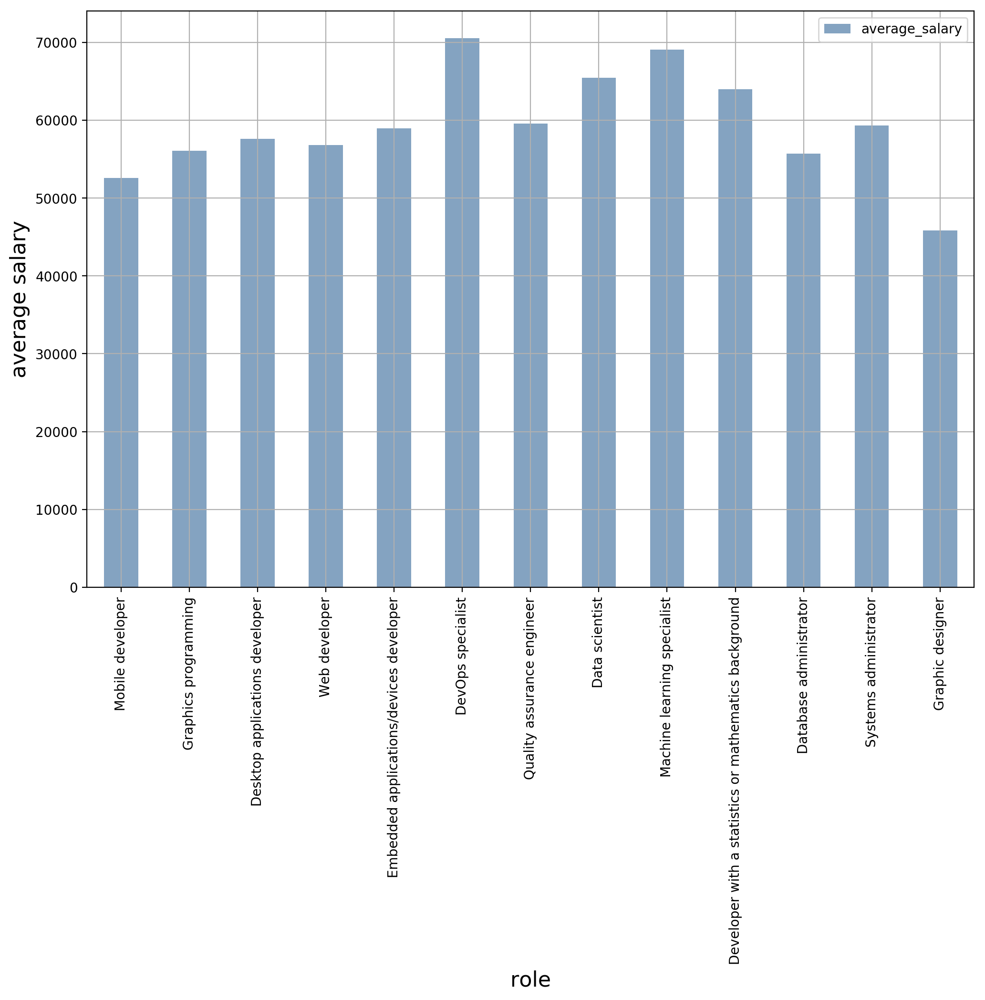

In [17]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 200

ax = roleDf.plot.bar(y='average_salary', color=(0.2, 0.4, 0.6, 0.6)).grid(True)

plt.xlabel('role', fontsize=16)
plt.ylabel('average salary', fontsize=16)



# How does experiance effect the related average developer salary?

### analyzing data...

In [18]:
aggDf = pd.DataFrame([roleExpDF[i] for i in sorted(roleExpDF)], index=pd.MultiIndex.from_tuples([i for i in sorted(roleExpDF.keys())])) 
aggDf=aggDf.reset_index()
aggDf.columns=["role","experience","avg","cnt","salary"]

aggDf[(aggDf.avg != 0)].sort_values("avg",ascending=False).head(10)

,role,experience,avg,cnt,salary
132,Graphic designer,13,150000.00,1,1.500000e+05
173,Machine learning specialist,14,135666.67,3,4.070000e+05
177,Machine learning specialist,18,133625.34,2,2.672507e+05
179,Machine learning specialist,20,132800.00,2,2.656000e+05
19,Data scientist,20,132800.00,2,2.656000e+05
119,Embedded applications/devices developer,20,124750.00,2,2.495000e+05
152,Graphics programming,13,122500.00,2,2.450000e+05
215,Other,16,109650.27,8,8.772021e+05
232,Quality assurance engineer,13,105232.97,3,3.156989e+05
197,Mobile developer,18,104984.87,15,1.574773e+06


In [19]:
aggDf = aggDf[(aggDf.avg != 0) & (aggDf.role != 'Other')][["role","experience","avg"]]

### visualizing data...

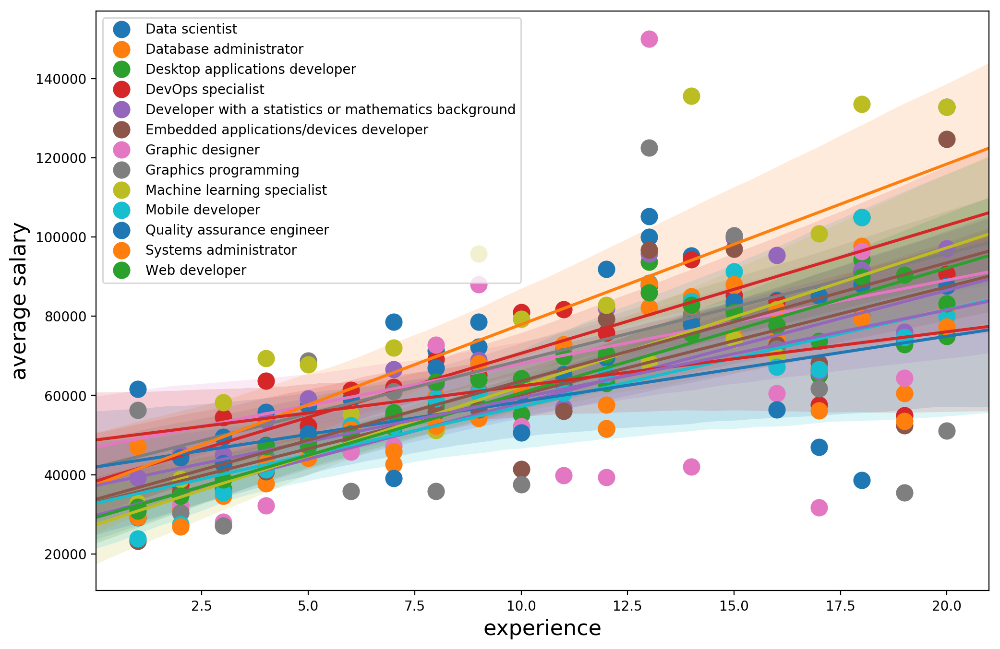

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 200

groups = aggDf.groupby('role')

fig, ax = plt.subplots()
ax.margins(0.05) 
for name, group in groups:
    ax.plot(group.experience, group.avg, marker='o', linestyle='', ms=12, label=name)
    
for name, group in groups:
    sns.regplot(group.experience, group.avg)

ax.legend()
plt.xlabel('experience', fontsize=16)
plt.ylabel('average salary', fontsize=16)
plt.show()


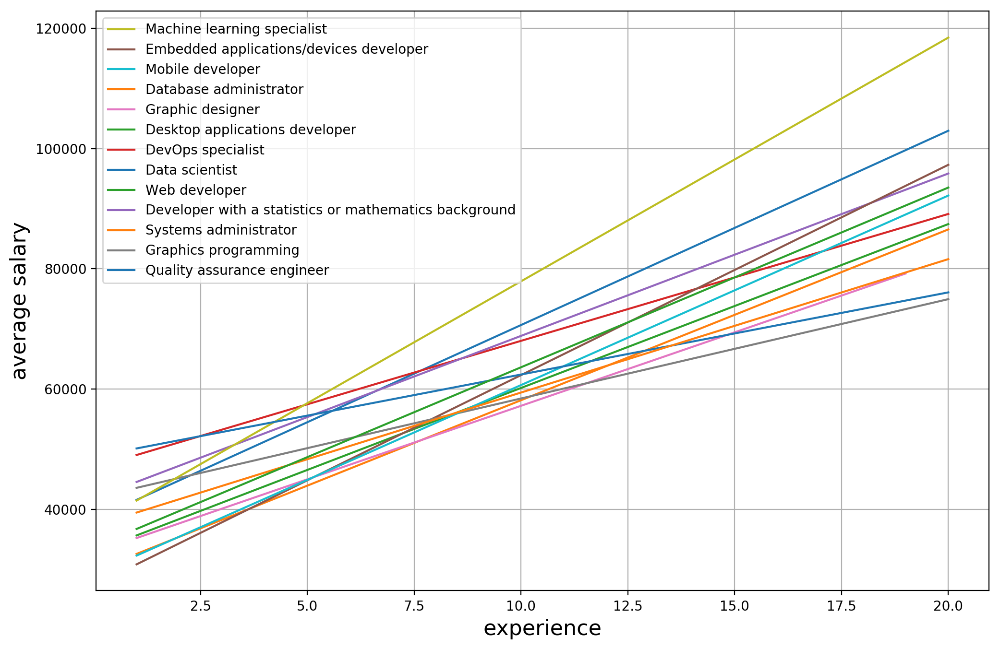

In [21]:
fig,ax = plt.subplots(1)

for name, group in groups:

    ax.plot(np.unique(group.experience), np.poly1d(np.polyfit(group.experience, group.avg, 1))(np.unique(group.experience)),label=name)

handles,labels = ax.get_legend_handles_labels()

slopes={}

for l in labels:
    slpDf = aggDf[(aggDf.role==l)&((aggDf.experience==1)|(aggDf.experience==18))][['avg']]
    start = slpDf.values[0][0]
    end = slpDf.values[1][0]
    slopes[l] = round((end-start)/18)*-1
    
slopeList = sorted(slopes, key=slopes.get)
slopeList

new_handles=[]
new_labels=[]

for s in range(len(slopeList)):
    if slopeList[s] != 'Other':
        idx = labels.index(slopeList[s])
        new_handles.append(handles[idx])
        new_labels.append(labels[idx])

labels = new_labels
handles = new_handles
    
ax.legend(handles, labels, loc='best')
plt.grid(True)
plt.xlabel('experience', fontsize=16)
plt.ylabel('average salary', fontsize=16)
plt.show()


# PREDICTION

In [22]:
def missing_data(data):
    """ takes dataframe and calculates each columns null rate
    data: dataframe that you'd like to take calculate missing value ratio of each column
    """
    total = data.isnull().sum().sort_values(ascending = True)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = True)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])


### cleaning data...

In [23]:
labelDf=df.copy().drop(["ExpectedSalary", "Respondent"], axis=1)

fitting numeric NaN vals based on other columns...

In [24]:
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

cat_vars = labelDf.select_dtypes(include=['object']).copy().columns
num_vars = labelDf.select_dtypes(include=['float', 'int']).copy().columns

imp = IterativeImputer(max_iter=10, random_state=0)

impDf = labelDf[labelDf["Salary"].isnull()==False].reset_index().copy()
imp.fit(impDf[num_vars])
impDf[num_vars]=pd.DataFrame(data=imp.transform(impDf[num_vars]), columns=num_vars)


In [25]:
impFinDf= impDf.copy().drop("index", axis=1)

rounding fitted numeric columns to nearest integer

In [26]:
for i in impFinDf.select_dtypes(include=['float', 'int']).columns:
    if i != "Salary":
        impFinDf[i] = impFinDf[i].apply(lambda x: round(x))

In [27]:
impFinDf.head(2)

,Professional,ProgramHobby,Country,University,EmploymentStatus,FormalEducation,MajorUndergrad,HomeRemote,CompanySize,CompanyType,YearsProgram,YearsCodedJob,YearsCodedJobPast,DeveloperType,WebDeveloperType,MobileDeveloperType,NonDeveloperType,CareerSatisfaction,JobSatisfaction,ExCoderReturn,ExCoderNotForMe,ExCoderBalance,ExCoder10Years,ExCoderBelonged,ExCoderSkills,ExCoderWillNotCode,ExCoderActive,PronounceGIF,ProblemSolving,BuildingThings,LearningNewTech,BoringDetails,JobSecurity,DiversityImportant,AnnoyingUI,FriendsDevelopers,RightWrongWay,UnderstandComputers,SeriousWork,InvestTimeTools,WorkPayCare,KinshipDevelopers,ChallengeMyself,CompetePeers,ChangeWorld,JobSeekingStatus,HoursPerWeek,LastNewJob,AssessJobIndustry,AssessJobRole,AssessJobExp,AssessJobDept,AssessJobTech,AssessJobProjects,AssessJobCompensation,AssessJobOffice,AssessJobCommute,AssessJobRemote,AssessJobLeaders,AssessJobProfDevel,AssessJobDiversity,AssessJobProduct,AssessJobFinances,ImportantBenefits,ClickyKeys,JobProfile,ResumePrompted,LearnedHiring,ImportantHiringAlgorithms,ImportantHiringTechExp,ImportantHiringCommunication,ImportantHiringOpenSource,ImportantHiringPMExp,ImportantHiringCompanies,ImportantHiringTitles,ImportantHiringEducation,ImportantHiringRep,ImportantHiringGettingThingsDone,Currency,Overpaid,TabsSpaces,EducationImportant,EducationTypes,SelfTaughtTypes,TimeAfterBootcamp,CousinEducation,WorkStart,HaveWorkedLanguage,WantWorkLanguage,HaveWorkedFramework,WantWorkFramework,HaveWorkedDatabase,WantWorkDatabase,HaveWorkedPlatform,WantWorkPlatform,IDE,AuditoryEnvironment,Methodology,VersionControl,CheckInCode,ShipIt,OtherPeoplesCode,ProjectManagement,EnjoyDebugging,InTheZone,DifficultCommunication,CollaborateRemote,MetricAssess,EquipmentSatisfiedMonitors,EquipmentSatisfiedCPU,EquipmentSatisfiedRAM,EquipmentSatisfiedStorage,EquipmentSatisfiedRW,InfluenceInternet,InfluenceWorkstation,InfluenceHardware,InfluenceServers,InfluenceTechStack,InfluenceDeptTech,InfluenceVizTools,InfluenceDatabase,InfluenceCloud,InfluenceConsultants,InfluenceRecruitment,InfluenceCommunication,StackOverflowDescribes,StackOverflowSatisfaction,StackOverflowDevices,StackOverflowFoundAnswer,StackOverflowCopiedCode,StackOverflowJobListing,StackOverflowCompanyPage,StackOverflowJobSearch,StackOverflowNewQuestion,StackOverflowAnswer,StackOverflowMetaChat,StackOverflowAdsRelevant,StackOverflowAdsDistracting,StackOverflowModeration,StackOverflowCommunity,StackOverflowHelpful,StackOverflowBetter,StackOverflowWhatDo,StackOverflowMakeMoney,Gender,HighestEducationParents,Race,SurveyLong,QuestionsInteresting,QuestionsConfusing,InterestedAnswers,Salary
0,Professional developer,"Yes, both",United Kingdom,No,Employed full-time,Bachelor's degree,Computer science or software engineering,"Less than half the time, but at least one day ...","10,000 or more employees",Publicly-traded corporation,20 or more years,20 or more years,NaN,Other,NaN,NaN,NaN,8,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"With a hard ""g,"" like ""gift""",Strongly agree,Strongly agree,Strongly agree,Somewhat agree,Agree,Strongly agree,Agree,Somewhat agree,Disagree,Disagree,Agree,Somewhat agree,Disagree,Somewhat agree,Agree,Disagree,Agree,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,British pounds sterling (£),Neither underpaid nor overpaid,Spaces,Not very important,Self-taught; Coding competition; Hackathon; Op...,Official documentation; Trade book; Textbook; ...,NaN,NaN,9:00 AM,Java; PHP; Python,C; Python; Rust,NaN,NaN,MySQL,NaN,NaN,NaN,Sublime Text; Vim; IntelliJ,Turn on some music,Agile; Lean; Scrum; Extreme; Pair; Kanban,Mercurial,Multiple times a day,Agree,Disagree,Disagree,Agree,Agree,Disagree,Somewhat agree,Customer satisfaction; Benchmarked product per...,Very satisfied,Somewhat satisfied,Satisfied,Satisfied,Somewhat satisfied,Very satisfied,A lot of influence,Some influence,Some influence,Some influence,A lot of influence,Some influence,Some influe

In [28]:
cols=['Professional', 'Country', 'University', 'EmploymentStatus', 'FormalEducation', 'MajorUndergrad', 'CompanyType', 'CompanySize', 'YearsProgram', 'YearsCodedJob', 'DeveloperType', 'JobSatisfaction', 'Overpaid', 'Gender', 'Race', 'Salary', 'HoursPerWeek', 'HomeRemote', 'WorkPayCare', 'ChallengeMyself', 'ChangeWorld', 'JobSeekingStatus']

In [29]:
cat_vars = impFinDf[cols].select_dtypes(include=['object']).copy().columns

for var in  cat_vars:
    impFinDf = pd.concat([impFinDf.drop(var, axis=1), pd.get_dummies(impFinDf[var], prefix=var, prefix_sep='_', drop_first=True)], axis=1)

### analyzing data...

In [30]:
labelFinDf=impFinDf.corr()
labelFinDf

CareerSatisfaction  \
CareerSatisfaction                                            1.000000   
JobSatisfaction                                               0.603445   
HoursPerWeek                                                 -0.059849   
StackOverflowSatisfaction                                     0.157764   
Salary                                                        0.149544   
Country_Albania                                              -0.002894   
Country_Argentina                                             0.001984   
Country_Armenia                                              -0.000575   
Country_Australia                                            -0.007422   
Country_Austria                                              -0.020050   
Country_Azerbaidjan                                           0.020456   
Country_Bangladesh                                           -0.027817   
Country_Belarus                                              -0.009923   
Country_Belgium                                              -0.011235   
Country_Bermuda                                              -0.004436   
Country_Bosnia-Herzegovina                                    0.001213   
Country_Brazil                                               -0.018932   
Country_Bulgaria                                             -0.007656   
Country_Canada                                                0.057727   
Country_Chile                                                -0.017268   
Country_China                                                -0.018555   
Country_Colombia                                              0.031478   
Country_Costa Rica                                            0.003861   
Country_Croatia                                               0.016687   
Country_Cyprus                                                0.017197   
Country_Czech Republic                                       -0.003847   
Country_Denmark                                               0.023199   
Country_Dominican Republic                                    0.016025   
Country_Ecuador                                               0.016272   
Country_Egypt                                                -0.018009   
...                                                                ...   
Race_Middle Eastern                                          -0.003153   
Race_Middle Eastern; I don’t know                            -0.004436   
Race_Middle Eastern; White or of European descent             0.013614   
Race_Native American, Pacific Islander, or Indi...           -0.011414   
Race_Native American, Pacific Islander, or Indi...           -0.004494   
Race_South Asian                                             -0.049995   
Race_South Asian; White or of European descent                0.012350   
Race_White or of European descent                             0.047973   
Race_White or of European descent; I don’t know               0.030646   
Race_White or of European descent; I don’t know...           -0.004436   
HomeRemote_About half the time                                0.028886   
HomeRemote_All or almost all the time (I'm full...            0.065894   
HomeRemote_It's complicated                                  -0.003537   
HomeRemote_Less than half the time, but at leas...            0.041509   
HomeRemote_More than half, but not all, the time              0.014672   
HomeRemote_Never                                             -0.112924   
WorkPayCare_Disagree                                         -0.003308   
WorkPayCare_Somewhat agree                                   -0.018212   
WorkPayCare_Strongly agree                                    0.007660   
WorkPayCare_Strongly disagree                                 0.041246   
ChallengeMyself_Disagree                                     -0.045138   
ChallengeMyself_Somewhat agree                               -0.067300   
ChallengeMyself_Strongly agree                          

In [31]:
targets = labelFinDf[(labelFinDf.Salary<=-0.04)|(labelFinDf.Salary>=0.04)].reset_index()["index"].tolist()

In [38]:
missing_data(impFinDf[targets]).head(20)

,Total,Percent
CareerSatisfaction,0,0.0
YearsCodedJob_18 to 19 years,0,0.0
YearsCodedJob_17 to 18 years,0,0.0
YearsCodedJob_16 to 17 years,0,0.0
YearsCodedJob_15 to 16 years,0,0.0
YearsCodedJob_14 to 15 years,0,0.0
YearsCodedJob_13 to 14 years,0,0.0
YearsCodedJob_12 to 13 years,0,0.0
YearsCodedJob_11 to 12 years,0,0.0
YearsCodedJob_10 to 11 years,0,0.0


### modelling data...

In [33]:
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

X =  impFinDf[targets].drop('Salary',axis=1)
y =  impFinDf["Salary"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)


In [34]:
lm_model= LinearRegression(normalize=True)
lm_model.fit(X_train, y_train)

predictions=lm_model.predict(X_test)

In [35]:
from sklearn import metrics
print('R2:', metrics.r2_score(y_test, predictions))

R2: 0.7266931026110112


### visualizing data...

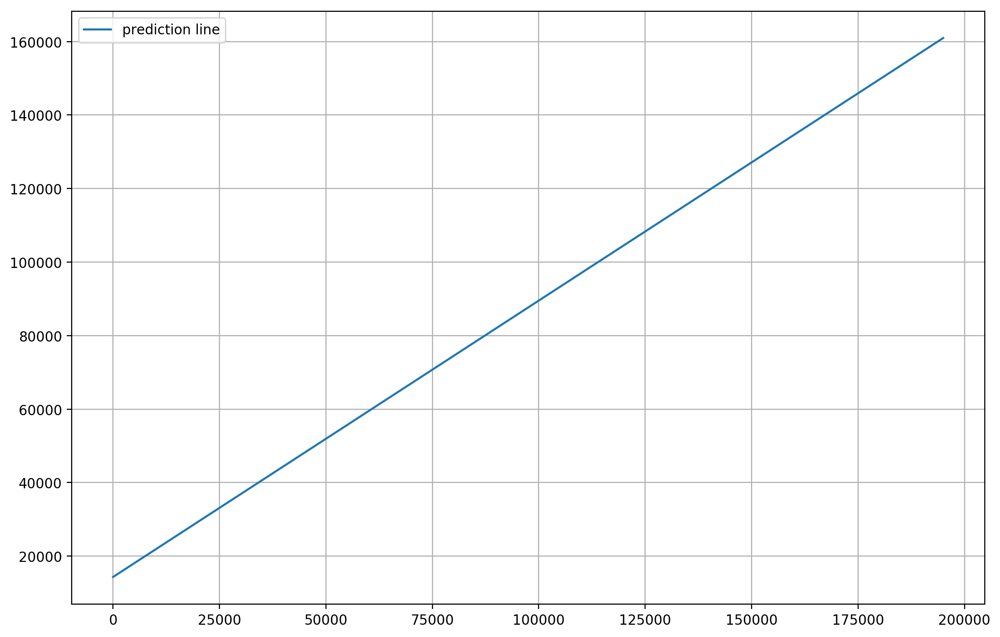

In [36]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 200

plt.plot(np.unique(y_test), np.poly1d(np.polyfit(y_test,predictions, 1))(np.unique(y_test)),label='prediction line')
plt.grid(True)
plt.legend(loc='best')